In [3]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad
scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=100, frameon=False)
cr.settings.verbosity = 2

/Users/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [4]:
#pip3 install scvelo

In [5]:
#pip install -U scvelo

In [6]:
adata = sc.read('/Users/usri/Desktop/YAO.7feb/feb10/adata3_feb12.scVelo.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 1770 × 1999
    obs: 'Barcode', 'old.barcode', 'orig.ident.x', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'nCount_ambiguous', 'nFeature_ambiguous', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'seurat_clusters.x', 'SCT_snn_res.0.5', 'clusters', 'percent.mt.x', 'SCT_snn_res.0.3', 'SCT_snn_res.0.2', 'orig.ident.y', 'nCount_RNA', 'nFeature_RNA', 'percent.mt.y', 'RNA_snn_res.0.6', 'seurat_clusters.y', 'Clusters', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'EMTScore.76GS', 'Clusters.old', 'Clusters.number', 'Clusters.term', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'Accession', 'Chromosome', 'End', 'Start', 

In [8]:
adata.obs

,Barcode,old.barcode,orig.ident.x,nCount_spliced,nFeature_spliced,nCount_unspliced,nFeature_unspliced,nCount_ambiguous,nFeature_ambiguous,nCount_SCT,...,initial_size_spliced,initial_size,n_counts,velocity_self_transition,velocity_length,velocity_confidence,velocity_confidence_transition,root_cells,end_points,velocity_pseudotime
possorted_genome_bam_K9RX7:AAACCCAGTCCGAAGAx,AAACCCAGTCCGAAGA-1,possorted_genome_bam_K9RX7:AAACCCAGTCCGAAGAx,possorted,22913.0,4969.0,5090.0,2782.0,3272.0,1358.0,16128.0,...,22913,22913.0,78.614529,0.098384,9.500000,0.922579,0.133375,0.023216,0.128100,0.155031
possorted_genome_bam_K9RX7:AAACCCATCACTGTCCx,AAACCCATCACTGTCC-1,possorted_genome_bam_K9RX7:AAACCCATCACTGTCCx,possorted,27440.0,5237.0,5162.0,2843.0,3534.0,1437.0,16040.0,...,27440,27440.0,6.248966,0.237515,10.400000,0.929207,0.118324,0.030602,0.156575,0.136005
possorted_genome_bam_K9RX7:AAACGCTAGGCTGGATx,AAACGCTAGGCTGGAT-1,possorted_genome_bam_K9RX7:AAACGCTAGGCTGGATx,possorted,15336.0,4196.0,4478.0,2170.0,2441.0,964.0,15307.0,...,15336,15336.0,1041.449630,0.241921,24.629999,0.880938,0.023200,0.532744,0.082583,0.080101
possorted_genome_bam_K9RX7:AAACGCTCATGAGTAAx,AAACGCTCATGAGTAA-1,possorted_genome_bam_K9RX7:AAACGCTCATGAGTAAx,possorted,23971.0,4398.0,3746.0,1987.0,2856.0,1079.0,15695.0,...,23971,23971.0,-97.481497,0.159975,8.310000,0.929445,0.092724,0.177533,0.038591,0.058449
possorted_genome_bam_K9RX7:AAAGAACCAACTGAAAx,AAAGAACCAACTGAAA-1,possorted_genome_bam_K9RX7:AAAGAACCAACTGAAAx,possorted,7347.0,2784.0,2622.0,1656.0,1071.0,633.0,14497.0,...,7347,7347.0,-88.482796,0.319843,13.090000,0.908661,-0.043836,0.114276,0.070827,0.100203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
possorted_genome_bam_K9RX7:TTTGATCTCAATCGGTx,TTTGATCTCAATCGGT-1,possorted_genome_bam_K9RX7:TTTGATCTCAATCGGTx,possorted,28138.0,5320.0,6734.0,3200.0,3665.0,1412.0,15979.0,...,28138,28138.0,130.531453,0.173730,8.430000,0.958683,0.046899,0.018706,0.675243,0.156232
possorted_genome_bam_K9RX7:TTTGGAGCAGGCACTCx,TTTGGAGCAGGCACTC-1,possorted_genome_bam_K9RX7:TTTGGAGCAGGCACTCx,possorted,25570.0,5454.0,7959.0,3454.0,3740.0,1506.0,16175.0,...,25570,25570.0,552.135698,0.310559,23.389999,0.876406,-0.116175,0.068799,0.019551,0.128617
possorted_genome_bam_K9RX7:TTTGGAGGTAACATGAx,TTTGGAGGTAACATGA-1,possorted_genome_bam_K9RX7:TTTGGAGGTAACATGAx,possorted,23972.0,5173.0,3411.0,2096.0,3153.0,1283.0,16057.0,...,23972,23972.0,226.271261,0.276761,12.750000,0.971383,-0.128660,0.013269,0.299947,0.143863
possorted_genome_bam_K9RX7:TTTGGAGTCGTGGGTCx,TTTGGAGTCGTGGGTC-1,possorted_genome_bam_K9RX7:TTTGGAGTCGTGGGTCx,possorted,4873.0,1973.0,1029.0,784.0,613.0,394.0,14611.0,...,4873,4873.0,-228.477894,0.079966,10.530000,0.928852,0.121362,0.107837,0.156675,0.054378


/Users/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


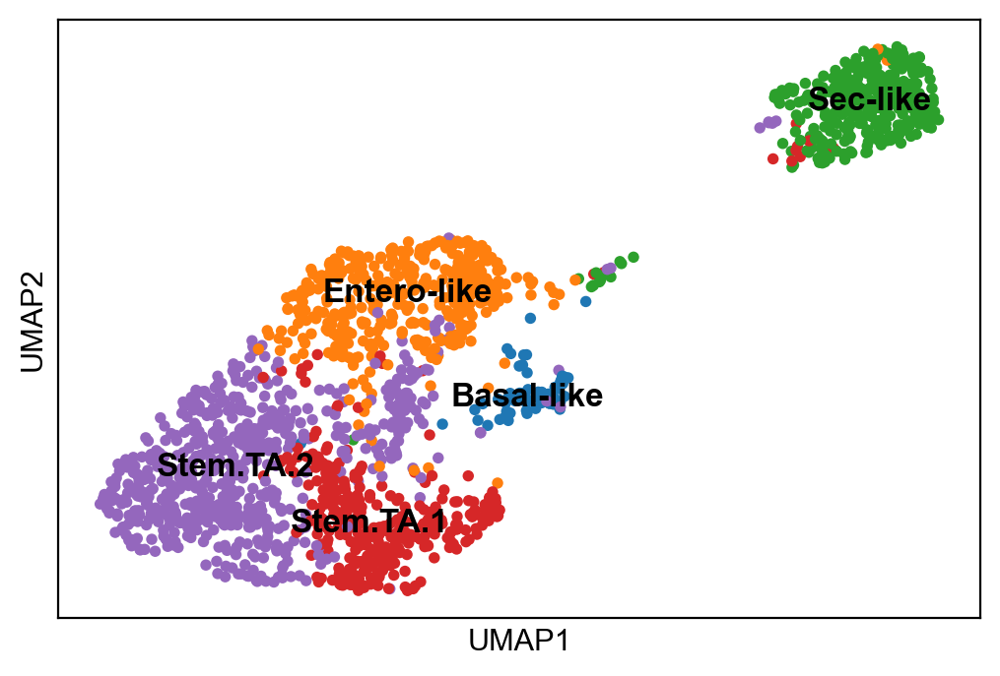

In [9]:
# plot umap to check
sc.pl.umap(adata, color='Clusters.term', frameon=True, legend_loc='on data', title='', save='_celltypes.pdf')

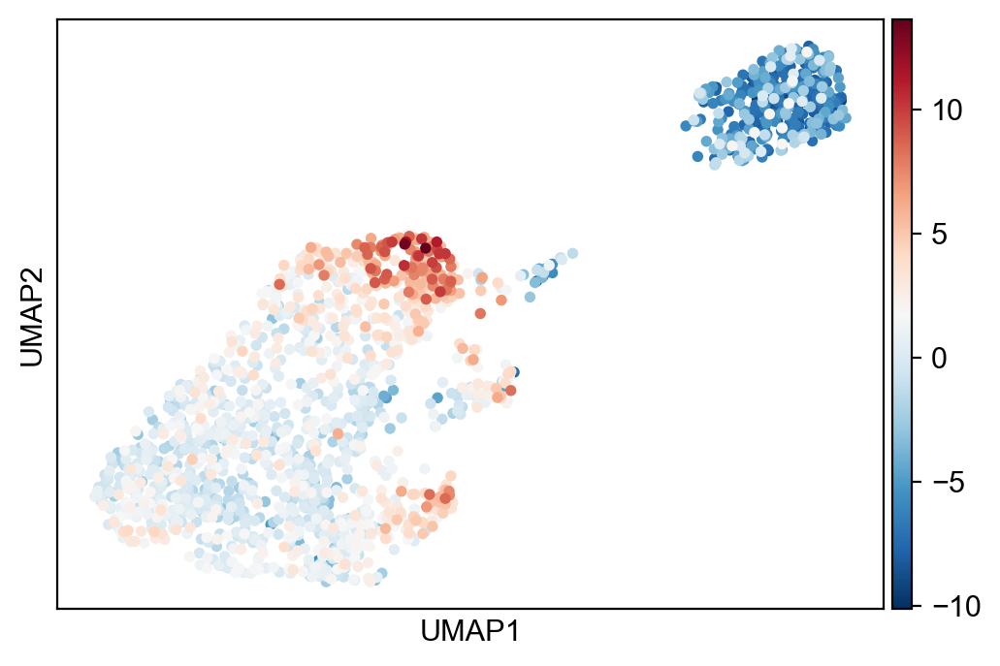

In [10]:
# plot umap to check
sc.pl.umap(adata, color='EMTScore.76GS', frameon=True, legend_loc='on data', title='', save='_celltypes.pdf')

/Users/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


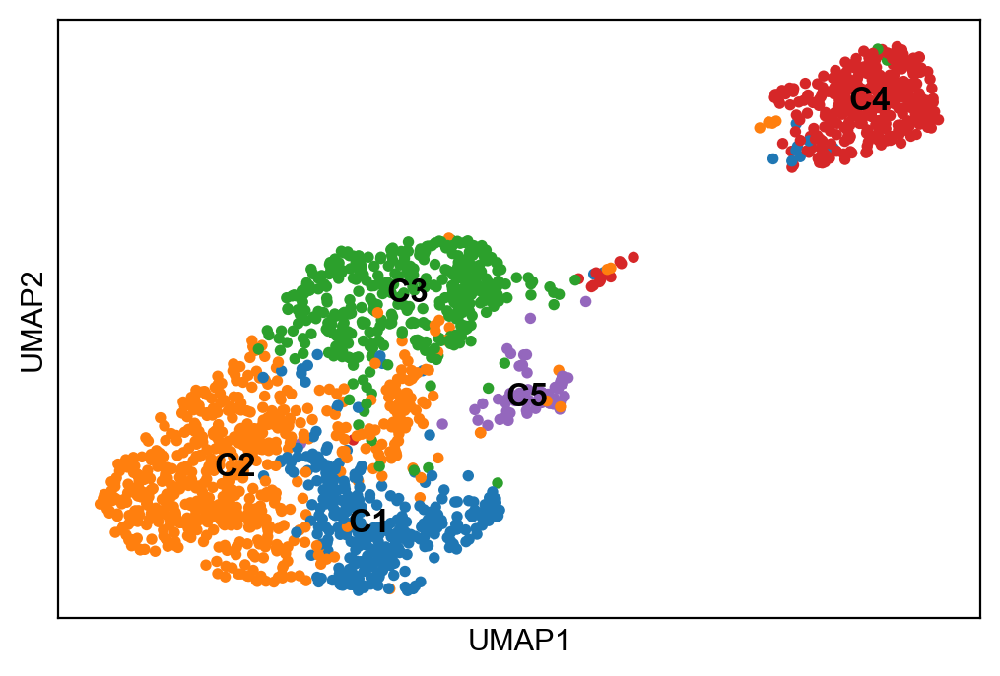

In [11]:
# plot umap to check
sc.pl.umap(adata, color='Clusters.number', frameon=True, legend_loc='on data', title='', save='_celltypes.pdf')

In [12]:
#adata = sc.read('/Users/usri/Desktop/YAO.7feb/feb10/qq.h5ad')

In [13]:
#ldata = scv.read('/Users/usri/Desktop/possorted_genome_bam_K9RX7.loom', cache=True)
#data = sc.read('/Users/usri/Desktop/M51_3LM.seurat.h5ad')
# merge matrices into the original adata object
#adata2 = scv.utils.merge(data, ldata)

In [14]:
##velocity 12 feb

In [15]:
# pre-process
#scv.pp.filter_and_normalize(adata3)
#scv.pp.moments(adata3)
# compute velocity
#scv.tl.velocity(adata3, mode='stochastic')
#scv.tl.velocity_graph(adata3)

saving figure to file ./figures/scvelo_embedding.pdf


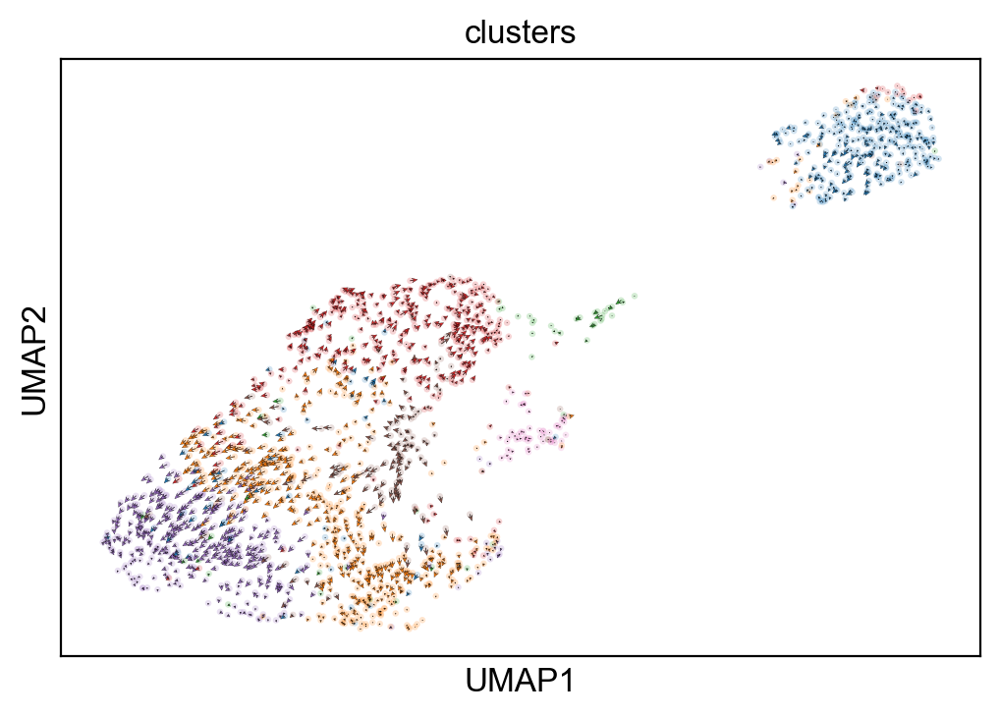

In [16]:
#Visualize velocity fields
scv.pl.velocity_embedding(adata, basis='umap', frameon=True, save='embedding.pdf')

In [17]:
scv.tl.rank_velocity_genes(adata, groupby='Clusters.number', min_corr=.3)

#df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
#df.head(30)

ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


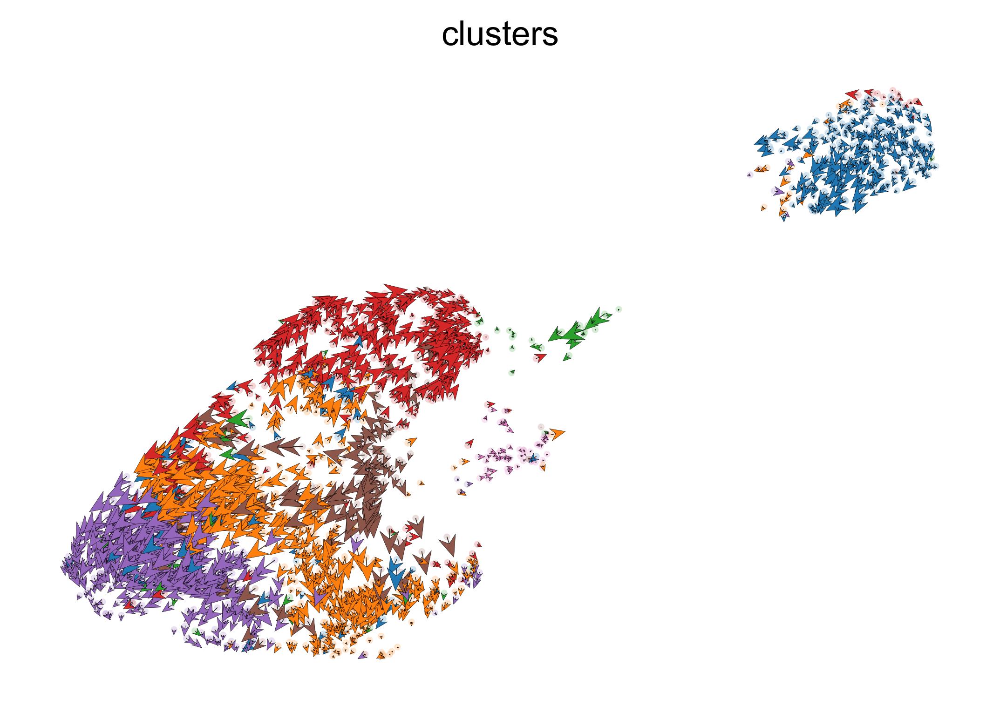

In [18]:
scv.pl.velocity_embedding(adata, arrow_length=3, arrow_size=4, dpi=220)

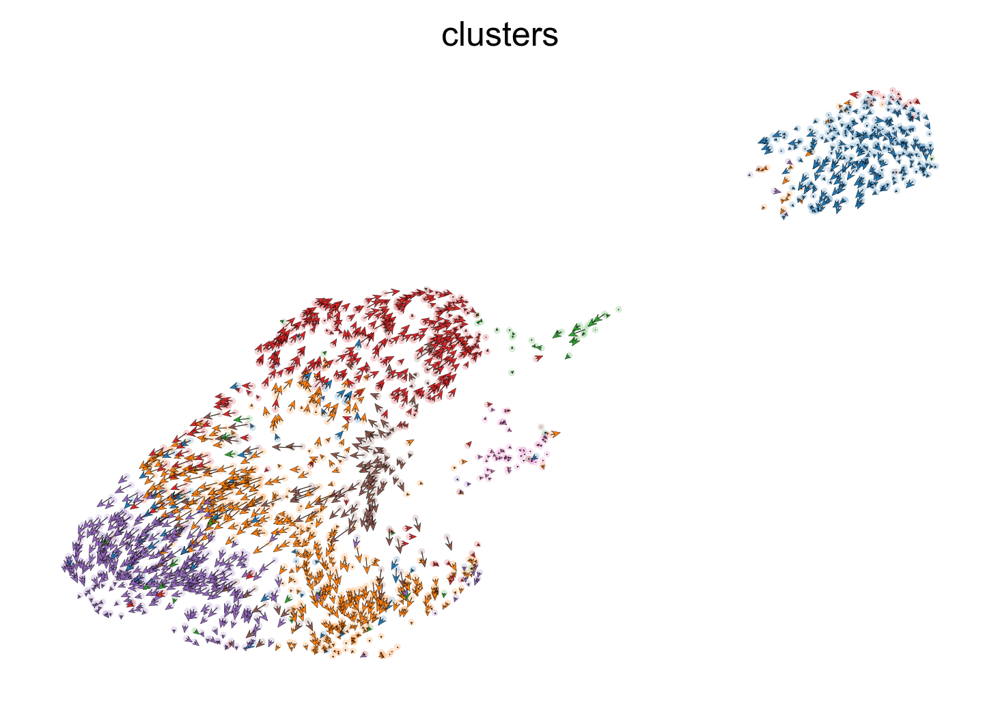

In [19]:
scv.pl.velocity_embedding(adata, basis='umap', arrow_length=2, arrow_size=1.5, dpi=150)

In [20]:
scv.tl.velocity_confidence(adata)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)


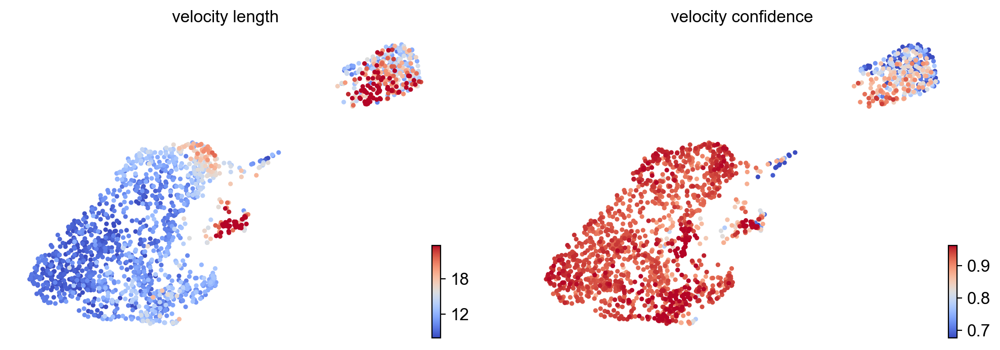

In [21]:
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

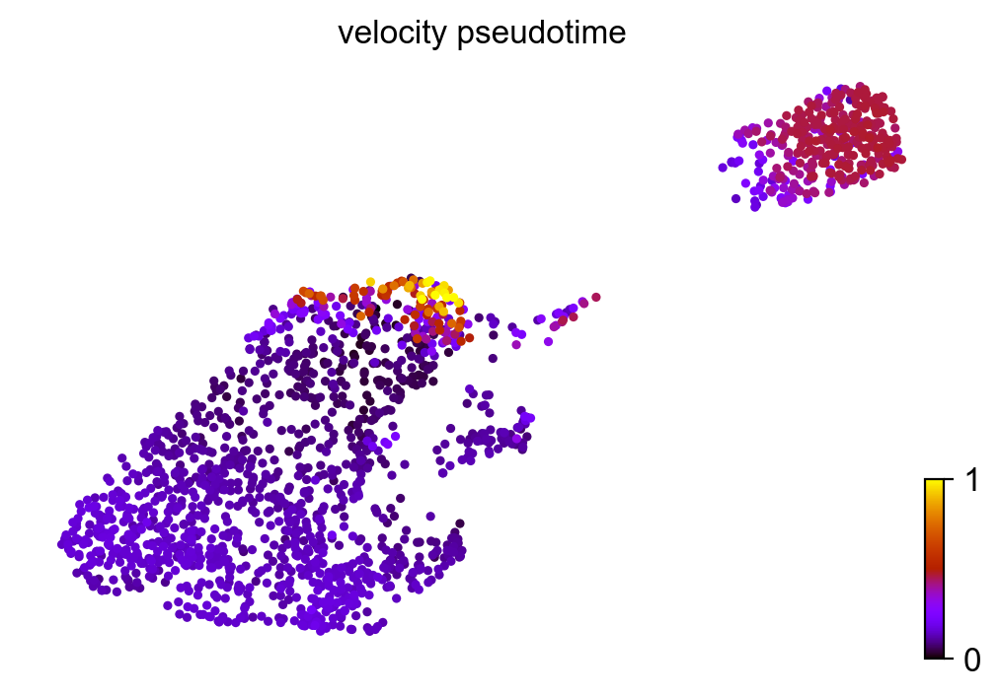

In [22]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

In [24]:
# this is needed due to a current bug - bugfix is coming soon.
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']
scv.tl.paga(adata, groups='Clusters.number')
df = scv.get_df(adata, '/Users/usri/Desktop/YAO.7feb/feb10/transitions_confidence', precision=1).T

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


ValueError: too many values to unpack (expected 2)

In [25]:
scv.tl.recover_dynamics(adata)

recovering dynamics (using 1/8 cores)


  0%|          | 0/572 [00:00<?, ?gene/s]

    finished (0:01:36) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/Users/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


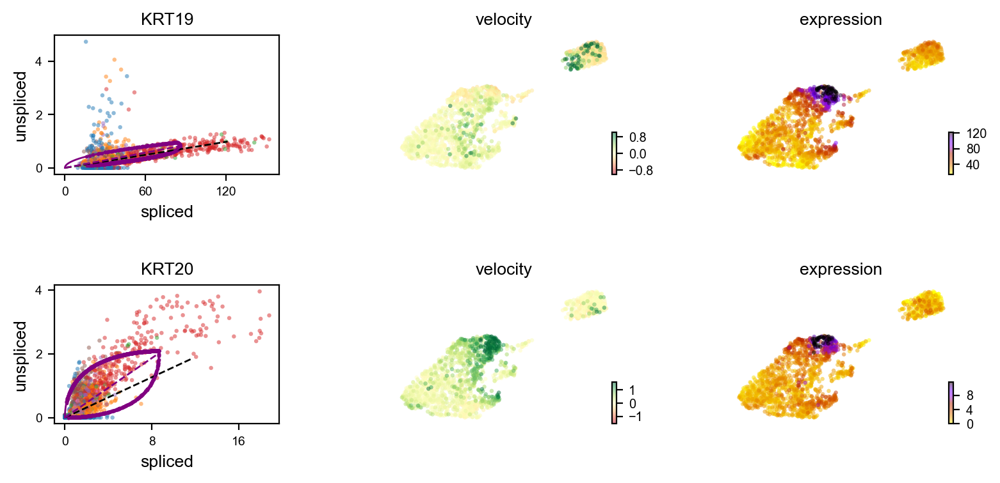

In [26]:
scv.pl.velocity(adata, ['KRT19',  'KRT20'])

In [27]:
#Differential Kinetic Test
#Distinct cell types and lineages may exhibit different kinetics regimes as these can be governed by a different network structure. 
var_names = ['KRT19', 'KRT20', 'KRT19', 'MUC17', 'KRT17', 'KRT18']
scv.tl.differential_kinetic_test(adata, var_names=var_names, groupby='Clusters.number')

testing for differential kinetics
    finished (0:00:00) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


saving figure to file /Users/usri/Desktop/YAO.7feb/feb10/KRT17_Velocity_PseudotimePlot2.21feb.pdf


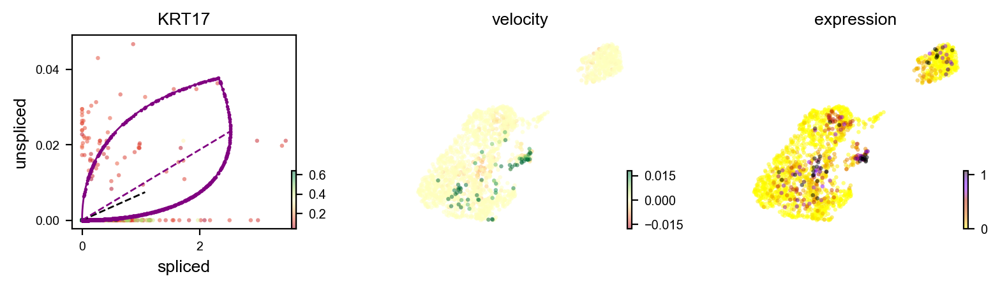

In [28]:
#### CHANGE THE GENES TO SEE DIFFERENT RNA VELOCITY ANALYSES Look at output 88 (cell above) to find some interesting genes
scv.pl.velocity(adata, ['KRT17'], ncols=1, color=['velocity_pseudotime'],basis='umap', save='/Users/usri/Desktop/YAO.7feb/feb10/KRT17_Velocity_PseudotimePlot2.21feb.pdf')

saving figure to file /Users/usri/Desktop/YAO.7feb/feb10/KRT19_Velocity_PseudotimePlot2.21feb.pdf


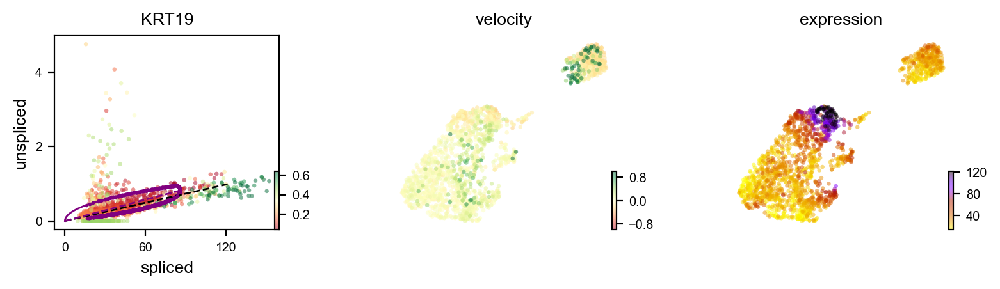

In [29]:
#### CHANGE THE GENES TO SEE DIFFERENT RNA VELOCITY ANALYSES Look at output 88 (cell above) to find some interesting genes
scv.pl.velocity(adata, ['KRT19'], ncols=1, color=['velocity_pseudotime'],basis='umap', save='/Users/usri/Desktop/YAO.7feb/feb10/KRT19_Velocity_PseudotimePlot2.21feb.pdf')

saving figure to file /Users/usri/Desktop/YAO.7feb/feb10/KRT20_Velocity_PseudotimePlot2.21feb.pdf


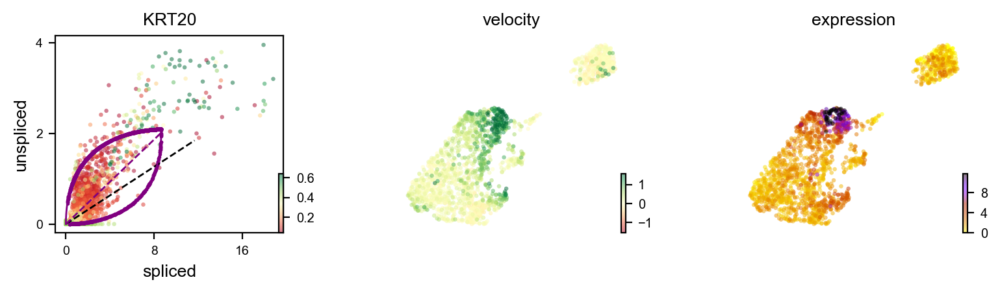

In [30]:
#### CHANGE THE GENES TO SEE DIFFERENT RNA VELOCITY ANALYSES Look at output 88 (cell above) to find some interesting genes
scv.pl.velocity(adata, ['KRT20'], ncols=1, color=['velocity_pseudotime'],basis='umap', save='/Users/usri/Desktop/YAO.7feb/feb10/KRT20_Velocity_PseudotimePlot2.21feb.pdf')

saving figure to file /Users/usri/Desktop/YAO.7feb/feb10/KRT18_Velocity_PseudotimePlot2.21feb.pdf


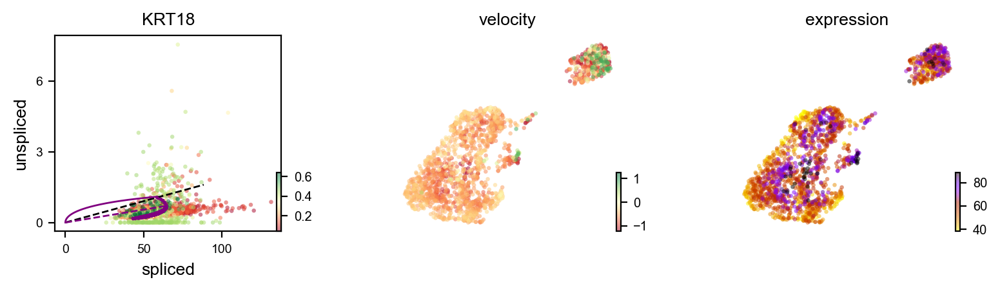

In [31]:
#### CHANGE THE GENES TO SEE DIFFERENT RNA VELOCITY ANALYSES Look at output 88 (cell above) to find some interesting genes
scv.pl.velocity(adata, ['KRT18'], ncols=1, color=['velocity_pseudotime'],basis='umap', save='/Users/usri/Desktop/YAO.7feb/feb10/KRT18_Velocity_PseudotimePlot2.21feb.pdf')

AttributeError: PathCollection.set() got an unexpected keyword argument 'groupby'

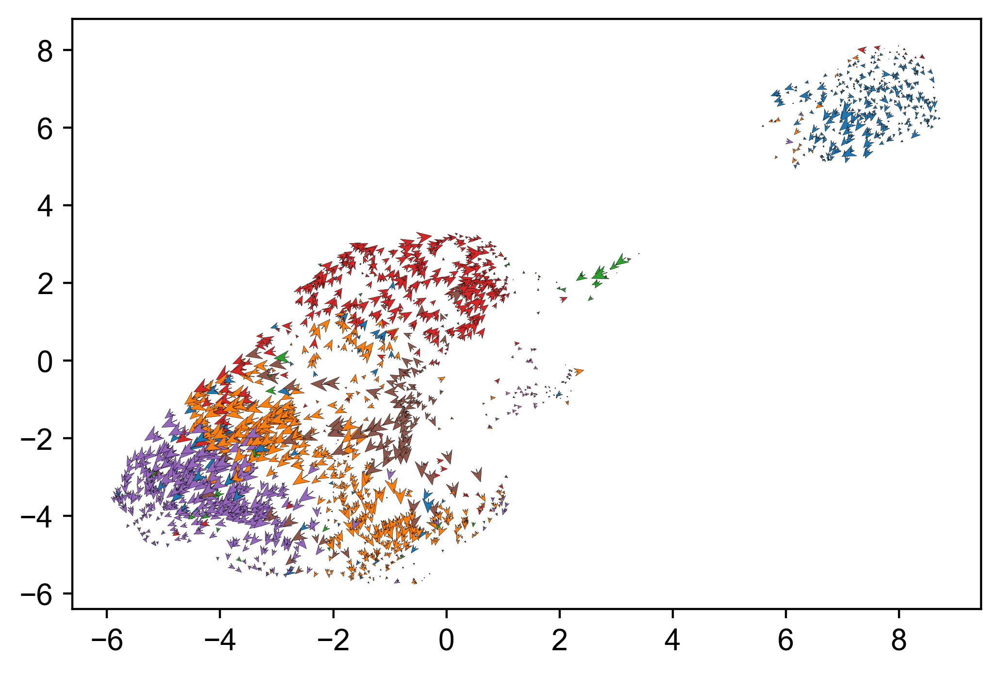

In [32]:
scv.pl.velocity_embedding(adata, arrow_length=2, arrow_size=3, dpi=200, groupby='Clusters.number' )

In [33]:
adata.obs

,Barcode,old.barcode,orig.ident.x,nCount_spliced,nFeature_spliced,nCount_unspliced,nFeature_unspliced,nCount_ambiguous,nFeature_ambiguous,nCount_SCT,...,initial_size_spliced,initial_size,n_counts,velocity_self_transition,velocity_length,velocity_confidence,velocity_confidence_transition,root_cells,end_points,velocity_pseudotime
possorted_genome_bam_K9RX7:AAACCCAGTCCGAAGAx,AAACCCAGTCCGAAGA-1,possorted_genome_bam_K9RX7:AAACCCAGTCCGAAGAx,possorted,22913.0,4969.0,5090.0,2782.0,3272.0,1358.0,16128.0,...,22913,22913.0,78.6,9.8e-02,9.5,0.9,1.3e-01,2.3e-02,1.3e-01,1.6e-01
possorted_genome_bam_K9RX7:AAACCCATCACTGTCCx,AAACCCATCACTGTCC-1,possorted_genome_bam_K9RX7:AAACCCATCACTGTCCx,possorted,27440.0,5237.0,5162.0,2843.0,3534.0,1437.0,16040.0,...,27440,27440.0,6.2,2.4e-01,10.4,0.9,1.2e-01,3.1e-02,1.6e-01,1.4e-01
possorted_genome_bam_K9RX7:AAACGCTAGGCTGGATx,AAACGCTAGGCTGGAT-1,possorted_genome_bam_K9RX7:AAACGCTAGGCTGGATx,possorted,15336.0,4196.0,4478.0,2170.0,2441.0,964.0,15307.0,...,15336,15336.0,1041.4,2.4e-01,24.6,0.9,2.3e-02,5.3e-01,8.3e-02,8.0e-02
possorted_genome_bam_K9RX7:AAACGCTCATGAGTAAx,AAACGCTCATGAGTAA-1,possorted_genome_bam_K9RX7:AAACGCTCATGAGTAAx,possorted,23971.0,4398.0,3746.0,1987.0,2856.0,1079.0,15695.0,...,23971,23971.0,-97.5,1.6e-01,8.3,0.9,9.3e-02,1.8e-01,3.9e-02,5.8e-02
possorted_genome_bam_K9RX7:AAAGAACCAACTGAAAx,AAAGAACCAACTGAAA-1,possorted_genome_bam_K9RX7:AAAGAACCAACTGAAAx,possorted,7347.0,2784.0,2622.0,1656.0,1071.0,633.0,14497.0,...,7347,7347.0,-88.5,3.2e-01,13.1,0.9,-4.4e-02,1.1e-01,7.1e-02,1.0e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
possorted_genome_bam_K9RX7:TTTGATCTCAATCGGTx,TTTGATCTCAATCGGT-1,possorted_genome_bam_K9RX7:TTTGATCTCAATCGGTx,possorted,28138.0,5320.0,6734.0,3200.0,3665.0,1412.0,15979.0,...,28138,28138.0,130.5,1.7e-01,8.4,1.0,4.7e-02,1.9e-02,6.8e-01,1.6e-01
possorted_genome_bam_K9RX7:TTTGGAGCAGGCACTCx,TTTGGAGCAGGCACTC-1,possorted_genome_bam_K9RX7:TTTGGAGCAGGCACTCx,possorted,25570.0,5454.0,7959.0,3454.0,3740.0,1506.0,16175.0,...,25570,25570.0,552.1,3.1e-01,23.4,0.9,-1.2e-01,6.9e-02,2.0e-02,1.3e-01
possorted_genome_bam_K9RX7:TTTGGAGGTAACATGAx,TTTGGAGGTAACATGA-1,possorted_genome_bam_K9RX7:TTTGGAGGTAACATGAx,possorted,23972.0,5173.0,3411.0,2096.0,3153.0,1283.0,16057.0,...,23972,23972.0,226.3,2.8e-01,12.8,1.0,-1.3e-01,1.3e-02,3.0e-01,1.4e-01
possorted_genome_bam_K9RX7:TTTGGAGTCGTGGGTCx,TTTGGAGTCGTGGGTC-1,possorted_genome_bam_K9RX7:TTTGGAGTCGTGGGTCx,possorted,4873.0,1973.0,1029.0,784.0,613.0,394.0,14611.0,...,4873,4873.0,-228.5,8.0e-02,10.5,0.9,1.2e-01,1.1e-01,1.6e-01,5.4e-02


In [34]:
ldata = scv.read('/Users/usri/Desktop/possorted_genome_bam_K9RX7.loom', cache=True)

/Users/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [35]:
ldata.obs

""
CellID
possorted_genome_bam_K9RX7:AAATGGAGTTGGGTTTx
possorted_genome_bam_K9RX7:AACAAAGAGTTGGAGCx
possorted_genome_bam_K9RX7:AATCGACTCAAGAATGx
possorted_genome_bam_K9RX7:AAGCCATTCTGGTCAAx
possorted_genome_bam_K9RX7:AACCCAAGTCCTGGTGx
...
possorted_genome_bam_K9RX7:TTCTTGACAATATCCGx
possorted_genome_bam_K9RX7:TTCTTGACACTTCAAGx
possorted_genome_bam_K9RX7:TTGAACGGTTCGGACCx


In [36]:
ldata

AnnData object with n_obs × n_vars = 2397 × 36601
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [37]:
# access data from specific layer
ldata.layers['spliced']

<2397x36601 sparse matrix of type '<class 'numpy.uint32'>'
	with 7700324 stored elements in Compressed Sparse Row format>

In [38]:
# merge matrices into the original adata object
adata2 = scv.utils.merge(adata, ldata)


In [39]:
adata2

AnnData object with n_obs × n_vars = 1770 × 1999
    obs: 'Barcode', 'old.barcode', 'orig.ident.x', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'nCount_ambiguous', 'nFeature_ambiguous', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'seurat_clusters.x', 'SCT_snn_res.0.5', 'clusters', 'percent.mt.x', 'SCT_snn_res.0.3', 'SCT_snn_res.0.2', 'orig.ident.y', 'nCount_RNA', 'nFeature_RNA', 'percent.mt.y', 'RNA_snn_res.0.6', 'seurat_clusters.y', 'Clusters', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'EMTScore.76GS', 'Clusters.old', 'Clusters.number', 'Clusters.term', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'Accession', 'Chromosome', 'End', 'Start', 

In [40]:
# inspect the ldata structure
# accessing a specific cell
ldata.obs_names[:5]

Index(['possorted_genome_bam_K9RX7:AAATGGAGTTGGGTTTx',
       'possorted_genome_bam_K9RX7:AACAAAGAGTTGGAGCx',
       'possorted_genome_bam_K9RX7:AATCGACTCAAGAATGx',
       'possorted_genome_bam_K9RX7:AAGCCATTCTGGTCAAx',
       'possorted_genome_bam_K9RX7:AACCCAAGTCCTGGTGx'],
      dtype='object', name='CellID')

In [41]:
adata.obs_names[:5]

Index(['possorted_genome_bam_K9RX7:AAACCCAGTCCGAAGAx',
       'possorted_genome_bam_K9RX7:AAACCCATCACTGTCCx',
       'possorted_genome_bam_K9RX7:AAACGCTAGGCTGGATx',
       'possorted_genome_bam_K9RX7:AAACGCTCATGAGTAAx',
       'possorted_genome_bam_K9RX7:AAAGAACCAACTGAAAx'],
      dtype='object')

saving figure to file ./figures/scvelo_embedding_stream.pdf


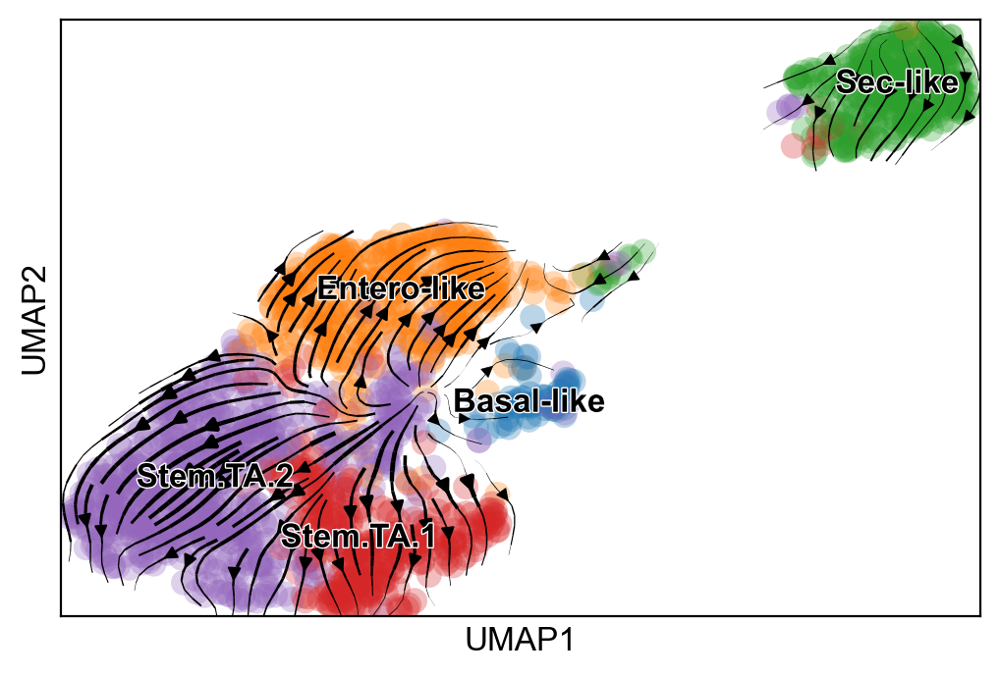

In [43]:
#Data preprocessing
scv.pl.velocity_embedding_stream(adata, basis='umap', frameon=True, color=['Clusters.term'], save='embedding_stream.pdf', title='')

/Users/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


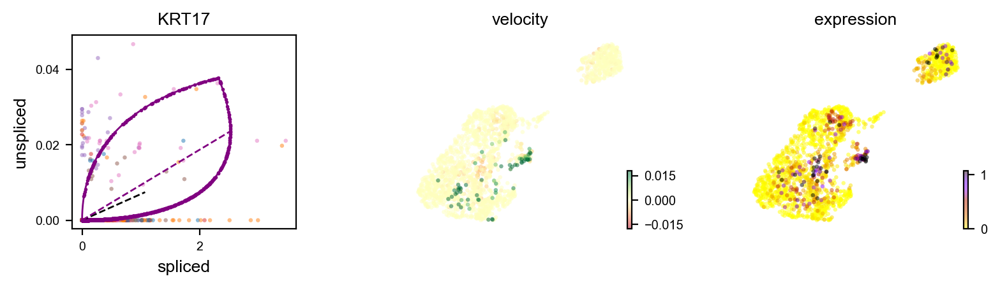

In [44]:
scv.pl.velocity(adata, var_names=['KRT17'])

In [45]:
import pandas as pd

In [46]:
scv.tl.rank_velocity_genes(adata, groupby='Clusters.number', min_corr=.3)
df = scv.DataFrame(adata.uns['rank_velocity_genes']['Clusters.number'])
df.head(50)

ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


AttributeError: module 'scvelo' has no attribute 'DataFrame'

In [47]:
#RNA velocity inference - EM model
#In order to calculate RNA velocity with the EM model, the parameters of splicing kinetics need to be infered first. The inference is taken care of by scVelo’s recover_dynamics function.

In [48]:
pip install NumPy

Note: you may need to restart the kernel to use updated packages.


In [49]:
scv.tl.recover_dynamics(adata, n_jobs=8)

recovering dynamics (using 8/8 cores)


  0%|          | 0/572 [00:00<?, ?gene/s]

/Users/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.4
  warnings.warn(f"A NumPy version >={np_minversion} an

    finished (0:00:38) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [50]:
top_genes = adata.var["fit_likelihood"].sort_values(ascending=False).index

In [51]:
top_genes

Index(['ISM1', 'MT4', 'KIT', 'KCTD16', 'ATAD2', 'BLM', 'KIF4A', 'P4HA1',
       'TSPAN5', 'CLSPN',
       ...
       'FHL1', 'MAGEA6', 'MAGEA1', 'SLC6A8', 'NAA10', 'FLNA', 'LAGE3', 'CTAG2',
       'MPP1', 'MT-ND6'],
      dtype='object', length=1999)

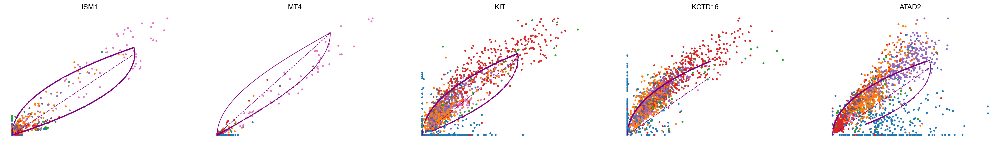

In [52]:
scv.pl.scatter(adata, basis=top_genes[:5], color="clusters", frameon=False)

In [53]:
top_genes[:50]

Index(['ISM1', 'MT4', 'KIT', 'KCTD16', 'ATAD2', 'BLM', 'KIF4A', 'P4HA1',
       'TSPAN5', 'CLSPN', 'PAPSS2', 'RND3', 'FAM171B', 'FOS', 'CDK19', 'CENPK',
       'TDP2', 'ZNF704', 'TPX2', 'FANCB', 'PCP4', 'HNMT', 'TCOF1', 'CDCA4',
       'KNL1', 'APCDD1', 'FAM83D', 'IQGAP2', 'E2F8', 'CCNE2', 'LGALS4',
       'GPA33', 'LIPH', 'EXO1', 'KCNJ8', 'HAVCR1', 'NXPE4', 'DBF4', 'LEF1',
       'KIF11', 'TSC22D1', 'SGO2', 'NR1H4', 'NCAPH', 'CDCA2', 'PRKDC',
       'HMGCS2', 'MAN1A1', 'PLPP1', 'KIF2C'],
      dtype='object')

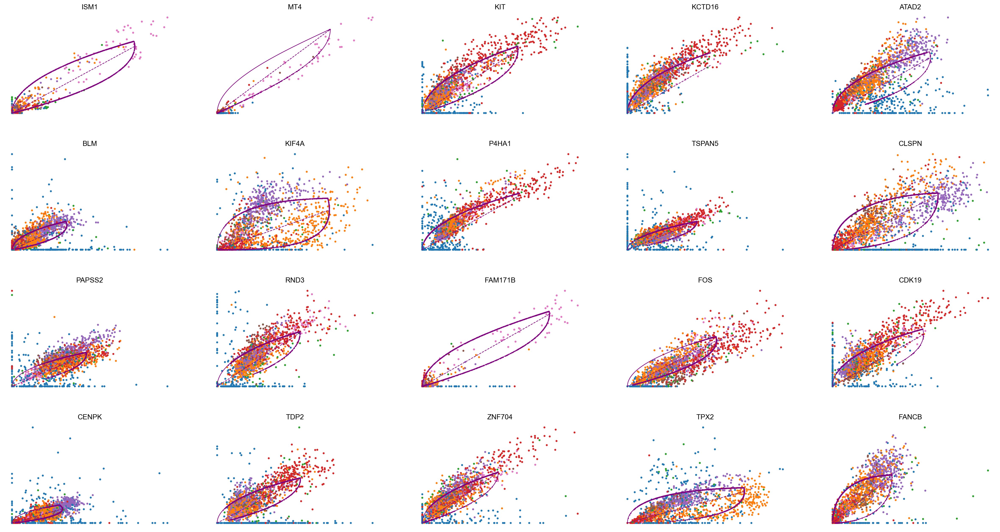

In [54]:
top_genes = adata.var["fit_likelihood"].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:20], ncols=5, frameon=False)

In [55]:
adata2 = adata

In [56]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 907 genes that are detected 20 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
Logarithmized X.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


/Users/anaconda3/lib/python3.9/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


In [57]:
# scv.pp.filter_and_normalize(adata_m)
# scv.pp.moments(adata_m)
adata

AnnData object with n_obs × n_vars = 1770 × 1092
    obs: 'Barcode', 'old.barcode', 'orig.ident.x', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'nCount_ambiguous', 'nFeature_ambiguous', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'seurat_clusters.x', 'SCT_snn_res.0.5', 'clusters', 'percent.mt.x', 'SCT_snn_res.0.3', 'SCT_snn_res.0.2', 'orig.ident.y', 'nCount_RNA', 'nFeature_RNA', 'percent.mt.y', 'RNA_snn_res.0.6', 'seurat_clusters.y', 'Clusters', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'EMTScore.76GS', 'Clusters.old', 'Clusters.number', 'Clusters.term', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'Accession', 'Chromosome', 'End', 'Start', 

In [58]:
adata.uns

{'Clusters.number_sizes': array([336, 637, 395, 337,  65]),
 'clusters_colors': array(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
        '#e377c2'], dtype=object),
 'neighbors': {'connectivities_key': 'connectivities',
  'distances_key': 'distances',
  'indices': array([[   0, 1139,  618, ...,  956,   92,  160],
         [   1, 1600, 1458, ...,  793, 1675, 1558],
         [   2,   44, 1286, ...,  399, 1174,  547],
         ...,
         [1767, 1237, 1064, ..., 1160,  523,  703],
         [1768,  808, 1268, ..., 1094,  126, 1078],
         [1769,  605, 1676, ..., 1587,   85, 1265]]),
  'params': {'method': 'umap',
   'metric': 'euclidean',
   'n_neighbors': 30,
   'use_rep': 'X_pca'}},
 'paga': {'connectivities': <5x5 sparse matrix of type '<class 'numpy.float64'>'
  	with 20 stored elements in Compressed Sparse Row format>,
  'connectivities_tree': <5x5 sparse matrix of type '<class 'numpy.float64'>'
  	with 4 stored elements in Compressed Sparse Row format>,
  

In [59]:
adata.X

array([[ 0.11826273,  0.31562925, -0.8585939 , ..., -0.53288836,
         0.25119726, -0.99518403],
       [ 0.53920285, -1.37473902, -0.8585939 , ..., -0.53288836,
        -1.3499457 , -0.00295977],
       [ 0.69517815, -0.74292346, -0.8585939 , ..., -0.53288836,
         0.07598547,  0.73638984],
       ...,
       [ 0.44734206,  0.18730093,  0.28749032, ...,  1.14787658,
         0.28527698,  0.75925265],
       [-2.31295114,         nan, -0.8585939 , ..., -0.53288836,
         0.81152764, -0.99518403],
       [ 0.4546843 , -0.16981851, -0.16670348, ..., -0.53288836,
         0.33658319, -0.35080488]])

In [60]:
adata.obs

,Barcode,old.barcode,orig.ident.x,nCount_spliced,nFeature_spliced,nCount_unspliced,nFeature_unspliced,nCount_ambiguous,nFeature_ambiguous,nCount_SCT,...,initial_size_spliced,initial_size,n_counts,velocity_self_transition,velocity_length,velocity_confidence,velocity_confidence_transition,root_cells,end_points,velocity_pseudotime
possorted_genome_bam_K9RX7:AAACCCAGTCCGAAGAx,AAACCCAGTCCGAAGA-1,possorted_genome_bam_K9RX7:AAACCCAGTCCGAAGAx,possorted,22913.0,4969.0,5090.0,2782.0,3272.0,1358.0,16128.0,...,22913,22913.0,34.5,9.8e-02,9.5,0.9,1.3e-01,2.3e-02,1.3e-01,1.6e-01
possorted_genome_bam_K9RX7:AAACCCATCACTGTCCx,AAACCCATCACTGTCC-1,possorted_genome_bam_K9RX7:AAACCCATCACTGTCCx,possorted,27440.0,5237.0,5162.0,2843.0,3534.0,1437.0,16040.0,...,27440,27440.0,49.7,2.4e-01,10.4,0.9,1.2e-01,3.1e-02,1.6e-01,1.4e-01
possorted_genome_bam_K9RX7:AAACGCTAGGCTGGATx,AAACGCTAGGCTGGAT-1,possorted_genome_bam_K9RX7:AAACGCTAGGCTGGATx,possorted,15336.0,4196.0,4478.0,2170.0,2441.0,964.0,15307.0,...,15336,15336.0,531.8,2.4e-01,24.6,0.9,2.3e-02,5.3e-01,8.3e-02,8.0e-02
possorted_genome_bam_K9RX7:AAACGCTCATGAGTAAx,AAACGCTCATGAGTAA-1,possorted_genome_bam_K9RX7:AAACGCTCATGAGTAAx,possorted,23971.0,4398.0,3746.0,1987.0,2856.0,1079.0,15695.0,...,23971,23971.0,-62.6,1.6e-01,8.3,0.9,9.3e-02,1.8e-01,3.9e-02,5.8e-02
possorted_genome_bam_K9RX7:AAAGAACCAACTGAAAx,AAAGAACCAACTGAAA-1,possorted_genome_bam_K9RX7:AAAGAACCAACTGAAAx,possorted,7347.0,2784.0,2622.0,1656.0,1071.0,633.0,14497.0,...,7347,7347.0,-79.5,3.2e-01,13.1,0.9,-4.4e-02,1.1e-01,7.1e-02,1.0e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
possorted_genome_bam_K9RX7:TTTGATCTCAATCGGTx,TTTGATCTCAATCGGT-1,possorted_genome_bam_K9RX7:TTTGATCTCAATCGGTx,possorted,28138.0,5320.0,6734.0,3200.0,3665.0,1412.0,15979.0,...,28138,28138.0,111.1,1.7e-01,8.4,1.0,4.7e-02,1.9e-02,6.8e-01,1.6e-01
possorted_genome_bam_K9RX7:TTTGGAGCAGGCACTCx,TTTGGAGCAGGCACTC-1,possorted_genome_bam_K9RX7:TTTGGAGCAGGCACTCx,possorted,25570.0,5454.0,7959.0,3454.0,3740.0,1506.0,16175.0,...,25570,25570.0,384.1,3.1e-01,23.4,0.9,-1.2e-01,6.9e-02,2.0e-02,1.3e-01
possorted_genome_bam_K9RX7:TTTGGAGGTAACATGAx,TTTGGAGGTAACATGA-1,possorted_genome_bam_K9RX7:TTTGGAGGTAACATGAx,possorted,23972.0,5173.0,3411.0,2096.0,3153.0,1283.0,16057.0,...,23972,23972.0,250.3,2.8e-01,12.8,1.0,-1.3e-01,1.3e-02,3.0e-01,1.4e-01
possorted_genome_bam_K9RX7:TTTGGAGTCGTGGGTCx,TTTGGAGTCGTGGGTC-1,possorted_genome_bam_K9RX7:TTTGGAGTCGTGGGTCx,possorted,4873.0,1973.0,1029.0,784.0,613.0,394.0,14611.0,...,4873,4873.0,-155.4,8.0e-02,10.5,0.9,1.2e-01,1.1e-01,1.6e-01,5.4e-02


In [61]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad
import pickle
import loompy as lmp

OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [62]:
import igraph
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import os

In [63]:
scv.logging.print_version()

Running scvelo 0.3.1 (python 3.9.12) on 2024-02-21 15:45.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


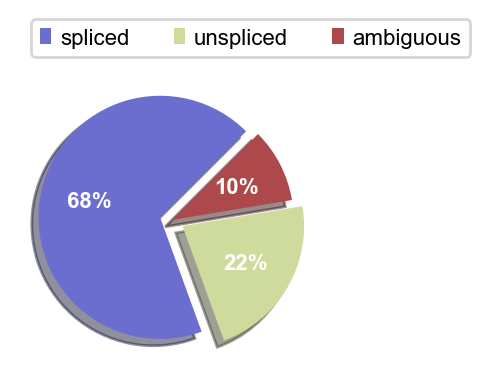

In [64]:
scv.pl.proportions(ldata)

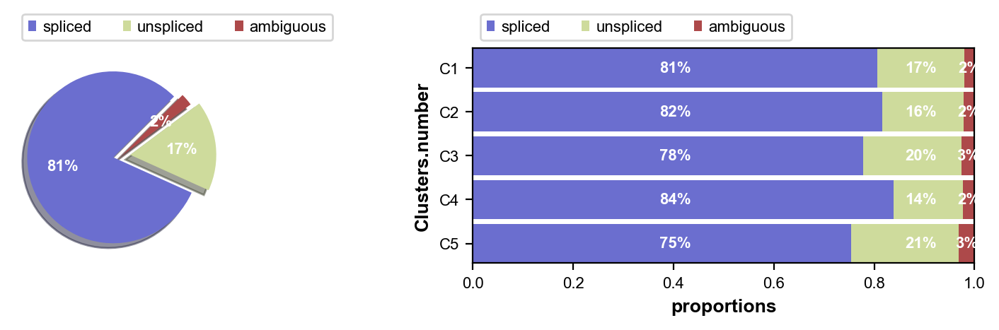

In [66]:
scv.pl.proportions(adata, groupby='Clusters.number')

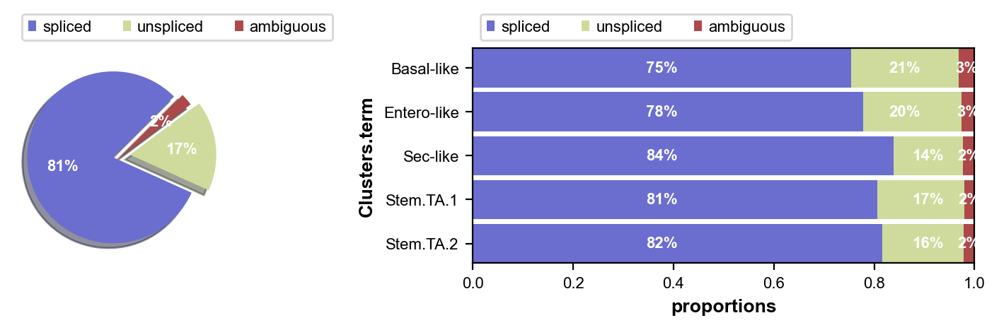

In [68]:
scv.pl.proportions(adata, groupby='Clusters.term')

In [69]:
adata2 = adata

In [73]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad
import pickle
import loompy as lmp
import igraph
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import os

In [75]:
#adata = sc.pp.filter_cells(adata, min_genes=200) #get rid of cells with fewer than 200 genes

In [80]:
adata = adata2

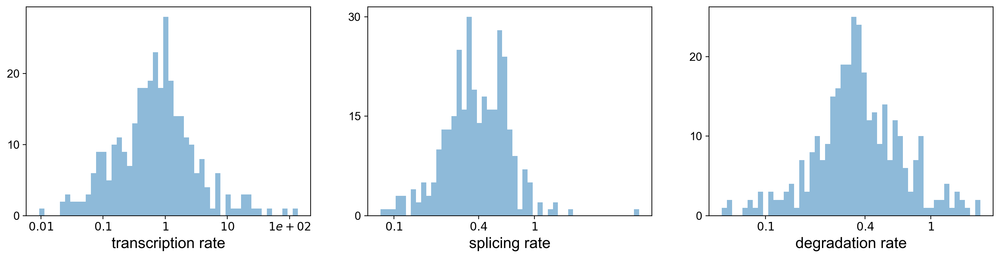

,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_diff_kinetics,fit_pval_kinetics
MUC17,1.4,2.4,0.9,5.2,1.7e-01,9.2e-02,0.2,0.1,0.0,0.0,0.5,0.4,1.6,1.8,1.0,C3,8.4e-03
KRT19,48.0,42.4,0.4,8.6,5.2e-03,2.8e-01,25.1,0.2,0.0,0.0,0.5,1.2,79.4,0.8,2.0,"C4,C5",3.8e-04


In [88]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

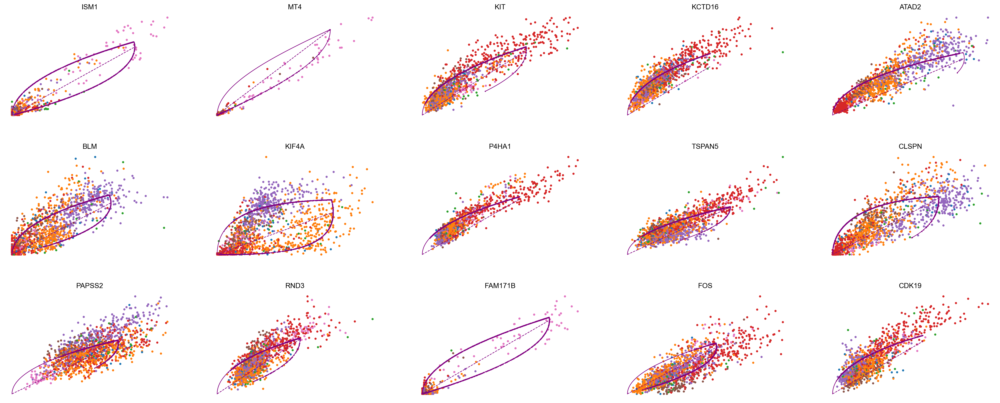

In [91]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False)


In [92]:
#Cluster-specific top-likelihood genes

In [121]:
scv.tl.rank_dynamical_genes(adata, groupby='Clusters.number')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(50)

ranking genes by cluster-specific likelihoods
    finished (0:00:01) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,C1,C2,C3,C4,C5
0,SKA3,KCTD16,PAPSS2,KIT,KIF20B
1,GPA33,TSPAN5,LPIN2,CENPF,MELK
2,TPX2,KNL1,DACH1,KIF14,FAM171B
3,CENPK,KIF4A,PRKDC,CLMN,ATAD2
4,KIT,KIF20B,KIT,IDI1,KCNJ8
5,MCM10,TDP2,SLC4A7,IQGAP2,RBP1
6,TSPAN5,GPA33,NMU,FAM13A,MT4
7,LGALS4,CENPK,RND3,XRCC2,PCP4
8,ATAD2,MELK,PLPP1,TMEM45B,HMCN1
9,LPIN2,HNMT,ARHGAP29,HJURP,SLC12A2


In [98]:
df.tail(50)

,C1,C2,C3,C4,C5
50,IDI1,ALCAM,AC009133.1,MSMO1,SLC38A4
51,NCAPG2,CEP152,CEMIP,ARHGAP29,SEMA6A
52,HJURP,MCM10,ART3,CD276,INSIG1
53,BICC1,TROAP,SULT1B1,PDCD4,FOS
54,FAM83D,MAOA,STYK1,KRT18,CENPK
55,SLC38A4,EFNB2,MYH9,HMOX1,MYH9
56,TROAP,NCAPG2,SELENBP1,CEMIP,CEMIP
57,KIF4A,DSCC1,TNFSF10,EGLN1,NCALD
58,MAP4K4,HMGCS2,TRIB1,RNF24,AC019117.2
59,KIF14,BICC1,BHLHE40,ODF2L,CASP8AP2


In [129]:
scv.tl.rank_dynamical_genes(adata, groupby='Clusters.term')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(50)


ranking genes by cluster-specific likelihoods
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Basal-like,Entero-like,Sec-like,Stem.TA.1,Stem.TA.2
0,KIF20B,PAPSS2,KIT,SKA3,KCTD16
1,MELK,LPIN2,CENPF,GPA33,TSPAN5
2,FAM171B,DACH1,KIF14,TPX2,KNL1
3,ATAD2,PRKDC,CLMN,CENPK,KIF4A
4,KCNJ8,KIT,IDI1,KIT,KIF20B
5,RBP1,SLC4A7,IQGAP2,MCM10,TDP2
6,MT4,NMU,FAM13A,TSPAN5,GPA33
7,PCP4,RND3,XRCC2,LGALS4,CENPK
8,HMCN1,PLPP1,TMEM45B,ATAD2,MELK
9,SLC12A2,ARHGAP29,HJURP,LPIN2,HNMT


In [104]:
df.tail(50)

,Basal-like,Entero-like,Sec-like,Stem.TA.1,Stem.TA.2
50,SLC38A4,AC009133.1,MSMO1,IDI1,ALCAM
51,SEMA6A,CEMIP,ARHGAP29,NCAPG2,CEP152
52,INSIG1,ART3,CD276,HJURP,MCM10
53,FOS,SULT1B1,PDCD4,BICC1,TROAP
54,CENPK,STYK1,KRT18,FAM83D,MAOA
55,MYH9,MYH9,HMOX1,SLC38A4,EFNB2
56,CEMIP,SELENBP1,CEMIP,TROAP,NCAPG2
57,NCALD,TNFSF10,EGLN1,KIF4A,DSCC1
58,AC019117.2,TRIB1,RNF24,MAP4K4,HMGCS2
59,CASP8AP2,BHLHE40,ODF2L,KIF14,BICC1


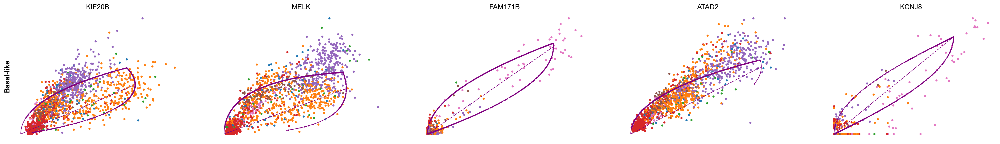

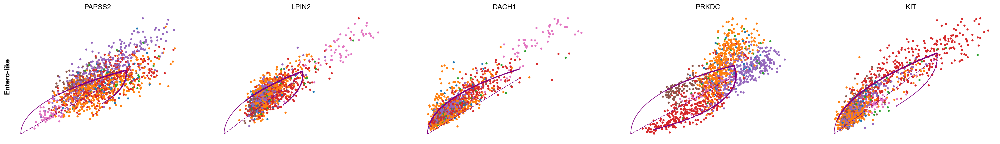

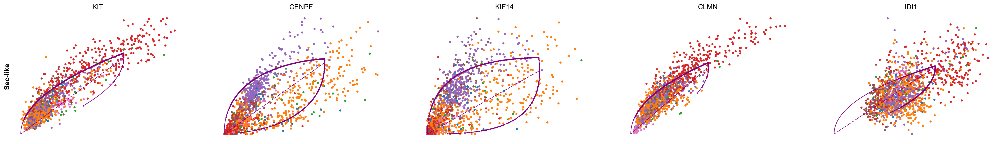

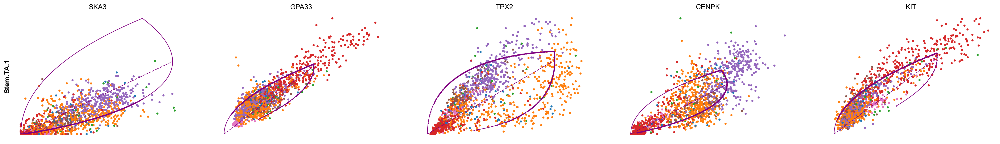

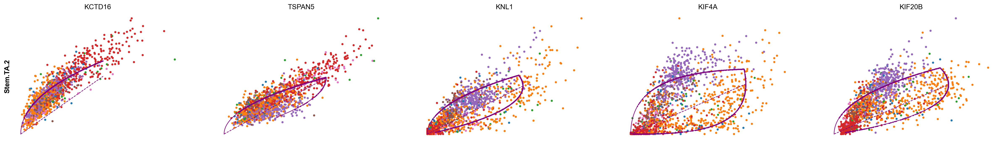

In [106]:
for cluster in ['Basal-like', 'Entero-like' ,	'Sec-like',	'Stem.TA.1', 'Stem.TA.2']:
    scv.pl.scatter(adata, df[cluster][:5], ylabel=cluster, frameon=False)


In [110]:
#### CHANGE THE GENES TO SEE DIFFERENT RNA VELOCITY ANALYSES Look at output 88 (cell above) to find some interesting genes
#scv.pl.velocity(adata, ['KRT20'], ncols=1, color=['velocity_pseudotime'],basis='umap', groupby='Clusters.term')

/Users/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


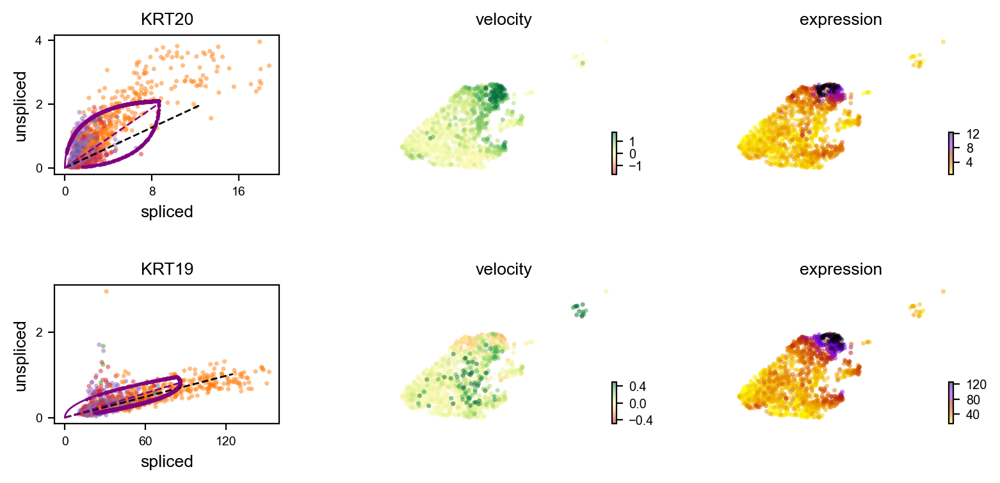

In [111]:
scv.pl.velocity(adata, ['KRT20', 'KRT19', 'KRT17'], color = 'Clusters.term')

/Users/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


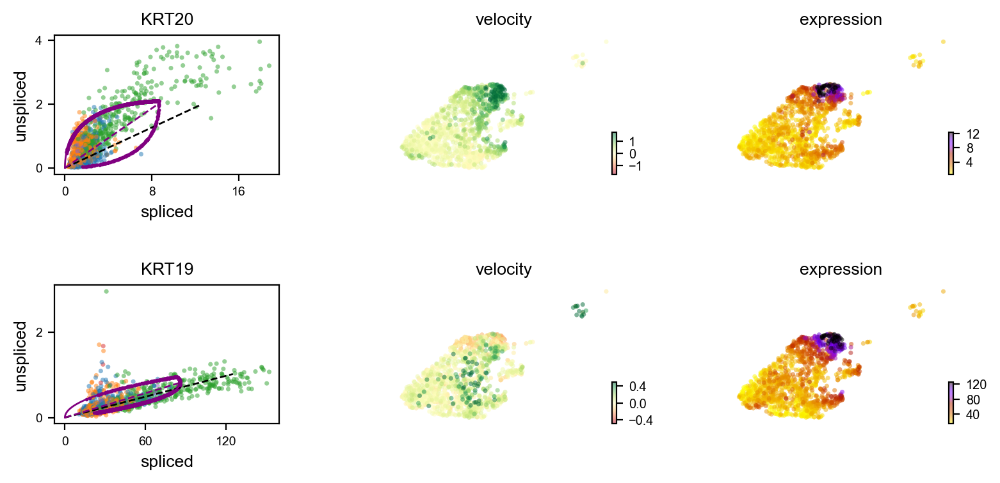

In [112]:
scv.pl.velocity(adata, ['KRT20', 'KRT19', 'KRT17'], color = 'Clusters.number')

In [126]:
#KRT17


saving figure to file /Users/usri/Desktop/YAO.7feb/feb10/embedding_stream.pdf


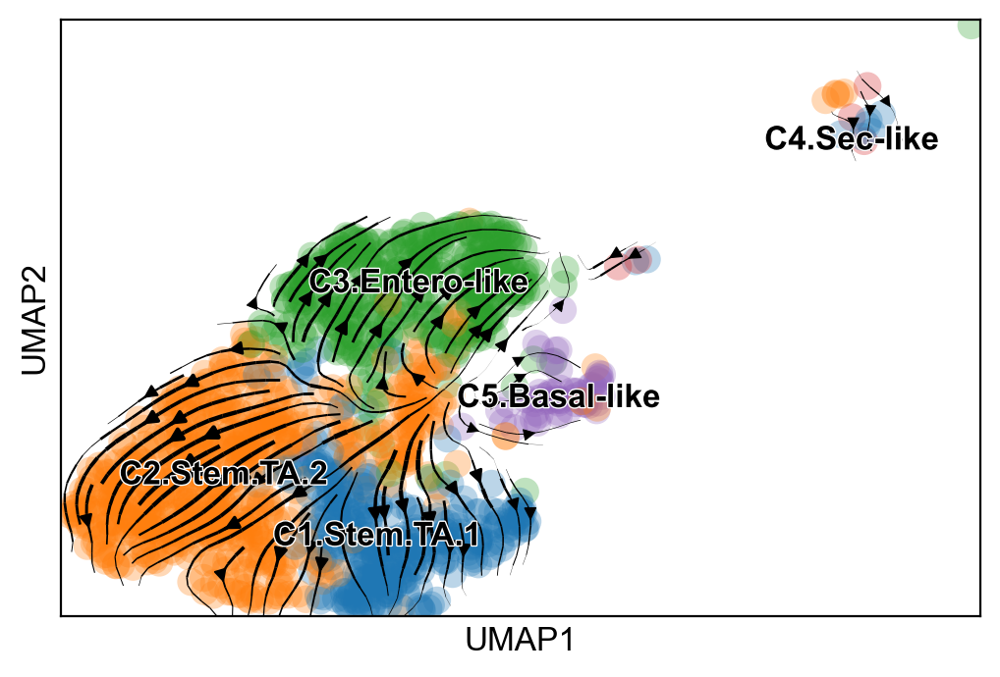

In [140]:
#Data preprocessing
scv.pl.velocity_embedding_stream(adata, basis='umap', frameon=True, color=['Clusters'], save='/Users/usri/Desktop/YAO.7feb/feb10/embedding_stream.pdf', title='')

In [ ]:
top30 =top_genes[:30]
top30adata = adata[:, top30]
top30adata

In [141]:
scv.tl.rank_velocity_genes(adata, groupby='clusters', min_corr=.3)
df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head(n=10)

ranking velocity genes
    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


AttributeError: module 'scvelo' has no attribute 'DataFrame'